# 데이터 분석 실무2
- 대중교통 데이터 분석

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
# 한글 찍기
import platform

from matplotlib import font_manager, rc
plt.rcParams['axes.unicode_minus'] = False

if platform.system() == 'Darwin':
    rc('font', family = 'AppleGothic')
elif platform.system() == 'Windows':
    rc('font', family = 'Malgun Gothic')   # 또는 '맑은 고딕'
else:
    print('Unknown system... sorry~~~~')

# subwayfee.csv 파일을 통한 지하철 유무임별 승하차 인원 현황 데이터 분석
- 자료출처: t-money.co.kr 에서 자료를 제공함. encoding = 'cp949'

In [3]:
df=pd.read_csv('datas/subwayfee.csv', encoding='cp949')
df

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764
1,2019-01,1호선,151,시청,676932,676266,102388,101033
2,2019-01,1호선,152,종각,1240810,1177643,162410,152062
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735
4,2019-01,1호선,154,종로5가,571824,583955,275447,263687
...,...,...,...,...,...,...,...,...
593,2019-01,우이신설선,4709,북한산보국문,131839,117790,40396,40629
594,2019-01,우이신설선,4710,정릉,83527,73090,43457,41092
595,2019-01,우이신설선,4711,성신여대입구(돈암),77040,89799,31555,29648
596,2019-01,우이신설선,4712,보문,31502,32724,15900,16109


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 598 entries, 0 to 597
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   사용월     598 non-null    object
 1   호선명     598 non-null    object
 2   역ID     598 non-null    int64 
 3   지하철역    598 non-null    object
 4   유임승차    598 non-null    int64 
 5   유임하차    598 non-null    int64 
 6   무임승차    598 non-null    int64 
 7   무임하차    598 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 37.5+ KB


In [5]:
df['사용월'].unique()

array(['2019-01'], dtype=object)

## 실습0. 유임승차,유임하차, 무임승차, 무임하차 4가지 별로, 각각 많은 역을 찾아보세요.

In [6]:
df

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764
1,2019-01,1호선,151,시청,676932,676266,102388,101033
2,2019-01,1호선,152,종각,1240810,1177643,162410,152062
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735
4,2019-01,1호선,154,종로5가,571824,583955,275447,263687
...,...,...,...,...,...,...,...,...
593,2019-01,우이신설선,4709,북한산보국문,131839,117790,40396,40629
594,2019-01,우이신설선,4710,정릉,83527,73090,43457,41092
595,2019-01,우이신설선,4711,성신여대입구(돈암),77040,89799,31555,29648
596,2019-01,우이신설선,4712,보문,31502,32724,15900,16109


In [7]:
# 유임승차 가장 많은 역
df.loc[df['유임승차']==df['유임승차'].max()]

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차
31,2019-01,2호선,222,강남,3153418,3210437,186486,167666


In [8]:
# 유임하차 가장 많은 역
df.loc[df['유임하차']==df['유임하차'].max()]

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차
31,2019-01,2호선,222,강남,3153418,3210437,186486,167666


In [9]:
# 무임승차 가장 많은 역
df.loc[df['무임승차']==df['무임승차'].max()]

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735


In [10]:
# 무임하차 가장 많은 역
df.loc[df['무임하차']==df['무임하차'].max()]

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차
7,2019-01,1호선,157,제기동,293540,288217,374571,400607


## 실습1. 무임승차 대비 유임승차 비율이 가장 높은 역

In [12]:
df['비율']=df['유임승차']/df['무임승차']
df['비율'].max()

np.float64(inf)

In [14]:
df[df['무임승차'] == 0]

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
192,2019-01,경원선,1022,창동,19,0,0,0,inf
237,2019-01,분당선,1031,복정,25,0,0,0,inf
266,2019-01,일산선,1949,지축,2,0,0,0,inf
328,2019-01,경의선,1291,서울역,11,0,0,0,inf
329,2019-01,경의선,1293,홍대입구,2,0,0,0,inf
330,2019-01,경의선,1295,김포공항,10,0,0,0,inf
331,2019-01,경의선,1296,계양,7,0,0,0,inf
332,2019-01,경의선,1297,검암,5,0,0,0,inf


In [16]:
df_1=df.loc[df['무임승차']!=0]
df_1

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764,6.856190
1,2019-01,1호선,151,시청,676932,676266,102388,101033,6.611439
2,2019-01,1호선,152,종각,1240810,1177643,162410,152062,7.639985
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735,1.816531
4,2019-01,1호선,154,종로5가,571824,583955,275447,263687,2.075986
...,...,...,...,...,...,...,...,...,...
593,2019-01,우이신설선,4709,북한산보국문,131839,117790,40396,40629,3.263665
594,2019-01,우이신설선,4710,정릉,83527,73090,43457,41092,1.922061
595,2019-01,우이신설선,4711,성신여대입구(돈암),77040,89799,31555,29648,2.441451
596,2019-01,우이신설선,4712,보문,31502,32724,15900,16109,1.981258


In [17]:
# copy(): 복사본 파일 만드는것과 동일
df_1 = df.loc[df['무임승차'] != 0 , ].copy()

In [18]:
df_1['비율']=df['유임승차']/df['무임승차']
df_1['비율'].max()

np.float64(27.5)

In [20]:
df_1.head(2)

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764,6.856190
1,2019-01,1호선,151,시청,676932,676266,102388,101033,6.611439


In [21]:
df_1.sort_values('비율', ascending=False).head(1)

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
72,2019-01,3호선,321,충무로,55,0,2,0,27.5


In [22]:
df.loc[df['지하철역']=='충무로']

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
72,2019-01,3호선,321,충무로,55,0,2,0,27.500000
108,2019-01,4호선,423,충무로,778649,804659,129893,131057,5.994542


## 실습2. 전체 승차인원(유임+무임)이 만명이상인 역 중, 유임승차 비율이 가장 높은 역

In [23]:
df_1['전체승차인원']=df['유임승차']+df['무임승차']

In [24]:
df_1['전체승차인원']>=10000

0      True
1      True
2      True
3      True
4      True
       ... 
593    True
594    True
595    True
596    True
597    True
Name: 전체승차인원, Length: 590, dtype: bool

In [27]:
df_1.loc[df_1['전체승차인원']>=10000].sort_values('비율', ascending=False).head(1)

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율,전체승차인원
48,2019-01,2호선,239,홍대입구,2351935,2507561,114832,111488,20.48153,2466767


## 실습3. 모든 역의 유임승차, 유임하차, 무임승차, 무임하차 총 4개를 파이차트로 나타내세요.

In [28]:
df

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764,6.856190
1,2019-01,1호선,151,시청,676932,676266,102388,101033,6.611439
2,2019-01,1호선,152,종각,1240810,1177643,162410,152062,7.639985
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735,1.816531
4,2019-01,1호선,154,종로5가,571824,583955,275447,263687,2.075986
...,...,...,...,...,...,...,...,...,...
593,2019-01,우이신설선,4709,북한산보국문,131839,117790,40396,40629,3.263665
594,2019-01,우이신설선,4710,정릉,83527,73090,43457,41092,1.922061
595,2019-01,우이신설선,4711,성신여대입구(돈암),77040,89799,31555,29648,2.441451
596,2019-01,우이신설선,4712,보문,31502,32724,15900,16109,1.981258


In [39]:
data = df.loc[0, '유임승차':'무임하차']
data

유임승차    1516452
유임하차    1400464
무임승차     221180
무임하차     211764
Name: 0, dtype: object

In [31]:
df.loc[0, '지하철역']

'서울역'

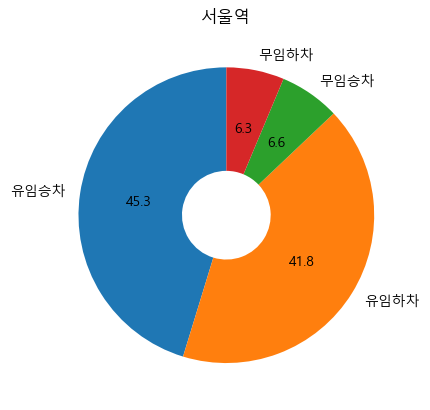

In [40]:
plt.pie(data, labels=data.index, startangle=90, wedgeprops={'width':0.7}, autopct='%-.1f')
plt.title(df.loc[0, '지하철역'])
plt.show()

In [42]:
df

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764,6.856190
1,2019-01,1호선,151,시청,676932,676266,102388,101033,6.611439
2,2019-01,1호선,152,종각,1240810,1177643,162410,152062,7.639985
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735,1.816531
4,2019-01,1호선,154,종로5가,571824,583955,275447,263687,2.075986
...,...,...,...,...,...,...,...,...,...
593,2019-01,우이신설선,4709,북한산보국문,131839,117790,40396,40629,3.263665
594,2019-01,우이신설선,4710,정릉,83527,73090,43457,41092,1.922061
595,2019-01,우이신설선,4711,성신여대입구(돈암),77040,89799,31555,29648,2.441451
596,2019-01,우이신설선,4712,보문,31502,32724,15900,16109,1.981258


In [41]:
df['지하철역'].value_counts().size

509

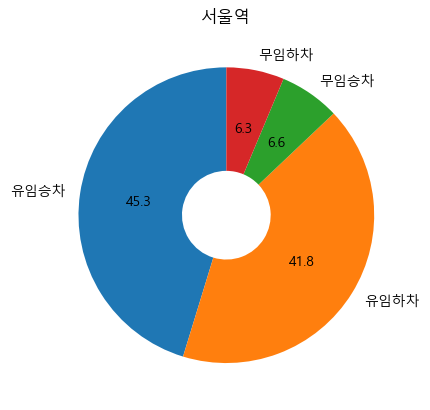

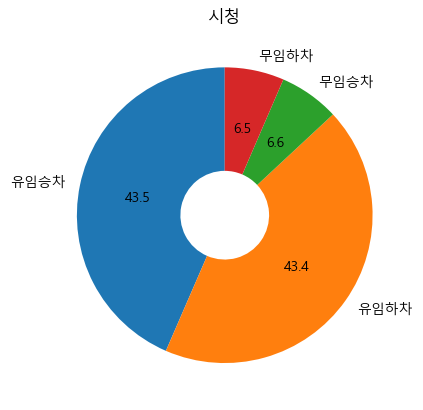

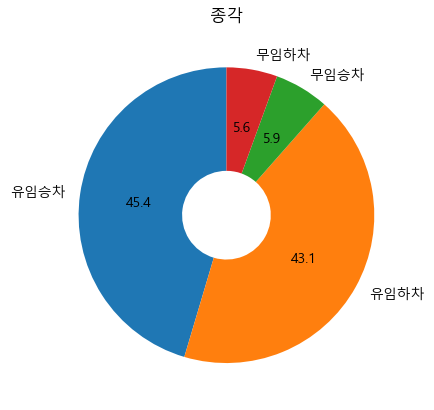

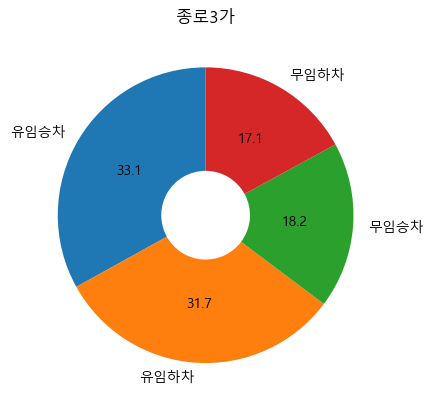

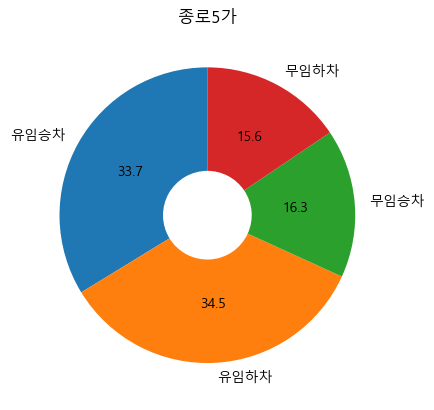

...

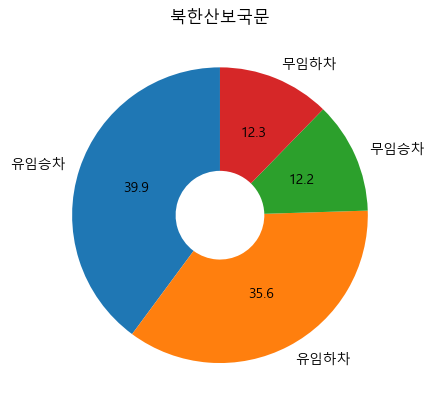

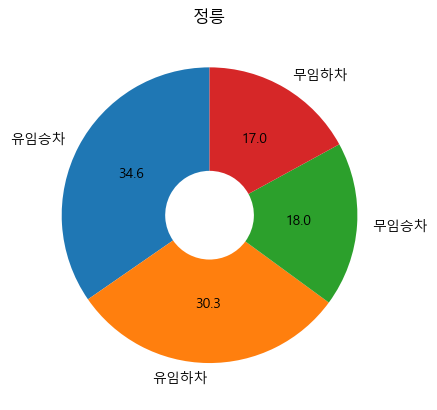

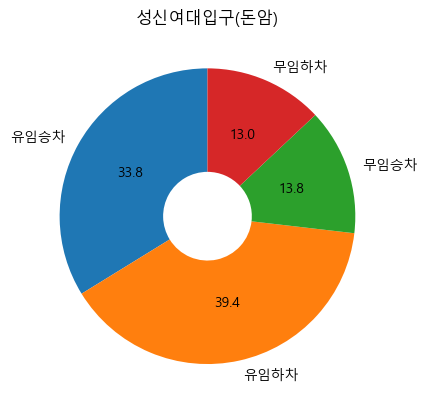

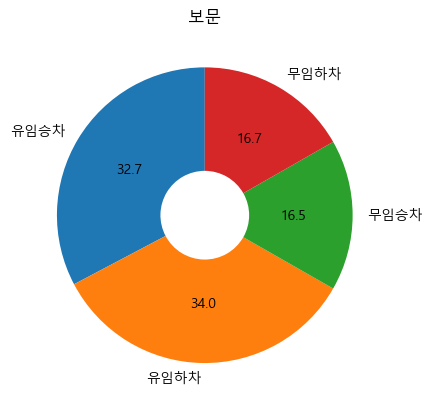

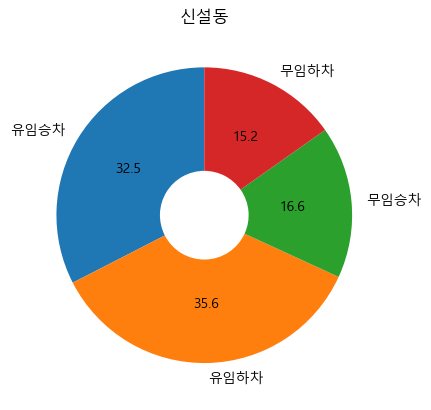

In [43]:
for index in range(598):
    data=df.loc[index, '유임승차':'무임하차']
    plt.pie(data, labels=data.index, startangle=90, wedgeprops={'width':0.7}, autopct='%-.1f')
    plt.title(df.loc[index, '지하철역'])
    plt.show()

## 실습4. 문제만들기

In [44]:
# 전체지하철 이용자 중에 무임승차 비율이 가장 높은 역 5개를 구하세요.

In [45]:
df

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율
0,2019-01,1호선,150,서울역,1516452,1400464,221180,211764,6.856190
1,2019-01,1호선,151,시청,676932,676266,102388,101033,6.611439
2,2019-01,1호선,152,종각,1240810,1177643,162410,152062,7.639985
3,2019-01,1호선,153,종로3가,703110,674148,387062,362735,1.816531
4,2019-01,1호선,154,종로5가,571824,583955,275447,263687,2.075986
...,...,...,...,...,...,...,...,...,...
593,2019-01,우이신설선,4709,북한산보국문,131839,117790,40396,40629,3.263665
594,2019-01,우이신설선,4710,정릉,83527,73090,43457,41092,1.922061
595,2019-01,우이신설선,4711,성신여대입구(돈암),77040,89799,31555,29648,2.441451
596,2019-01,우이신설선,4712,보문,31502,32724,15900,16109,1.981258


In [51]:
df['전체승차인원']=df['유임승차']+df['무임승차']
df['무임승차비율']=df['무임승차']/df['전체승차인원']
df['무임승차비율']=df['무임승차비율'].fillna(0)

In [53]:
stations_top5=df.sort_values('무임승차비율', ascending=False).head(5)
stations_top5

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율,전체승차인원,무임승차비율
208,2019-01,경원선,1916,소요산,48337,37020,62372,54630,0.774979,110709,0.563387
7,2019-01,1호선,157,제기동,293540,288217,374571,400607,0.783670,668111,0.560642
295,2019-01,중앙선,1219,용문,36259,36316,34572,34257,1.048797,70831,0.488091
591,2019-01,우이신설선,4707,삼양사거리,37572,38401,35436,36998,1.060278,73008,0.485371
301,2019-01,장항선,1407,온양온천,84623,85690,73363,73626,1.153483,157986,0.464364


In [54]:
# 전체 승차 인원이 50만명 이상인 역들 중에서 무임승차 비율이 가장 높은 역 5개를 찾으세요.

In [62]:
df_1['비율'] = df_1['유임승차'] / df_1['무임승차']

In [63]:
df_1['전체승차인원'] = df_1['유임승차'] + df_1['무임승차']

In [64]:
df_1['전체승차인원'] >= 500000

0       True
1       True
2       True
3       True
4       True
       ...  
593    False
594    False
595    False
596    False
597    False
Name: 전체승차인원, Length: 590, dtype: bool

In [65]:
df_1.loc[ df_1['전체승차인원'] >= 500000].sort_values('비율', ascending=False).head(5)

,사용월,호선명,역ID,지하철역,유임승차,유임하차,무임승차,무임하차,비율,전체승차인원
48,2019-01,2호선,239,홍대입구,2351935,2507561,114832,111488,20.481530,2466767
557,2019-01,9호선,4125,신논현,965930,995451,57013,54557,16.942276,1022943
31,2019-01,2호선,222,강남,3153418,3210437,186486,167666,16.909677,3339904
129,2019-01,경부선,1702,가산디지털단지,470248,552752,31014,33827,15.162443,501262
502,2019-01,7호선,2748,가산디지털단지,1200693,1191942,82182,77361,14.610170,1282875
